In [1]:
import cv2
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from skimage.io import imread
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image

import os
print(os.listdir("../input/airbus-ship-detection/"))

['test_v2', 'sample_submission_v2.csv', 'train_ship_segmentations_v2.csv', 'train_v2']


# Load data

In [2]:
TRAIN = os.listdir("../input/airbus-ship-detection/train_v2")
TEST = os.listdir("../input/airbus-ship-detection/test_v2")

TRAIN_DIR = '../input/airbus-ship-detection/train_v2'

In [3]:
df = pd.read_csv('../input/airbus-ship-detection/train_ship_segmentations_v2.csv')
df.head(10)

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...
5,000194a2d.jpg,198320 10 199088 10 199856 10 200624 10 201392...
6,000194a2d.jpg,55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...
7,000194a2d.jpg,254389 9 255157 17 255925 17 256693 17 257461 ...
8,0001b1832.jpg,NaN
9,00021ddc3.jpg,108287 1 109054 3 109821 4 110588 5 111356 5 1...


**ImageId** - image name

**EncodedPixels** -  pixels where is ship

In [4]:
df_show = df.copy()

# Exploration

### Dataset contain 231723 images

In [5]:
df.shape

(231723, 2)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231723 entries, 0 to 231722
Data columns (total 2 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   ImageId        231723 non-null  object
 1   EncodedPixels  81723 non-null   object
dtypes: object(2)
memory usage: 3.5+ MB


In [7]:
# add column which shows whether there is a ship
df['Exist_ship'] = df['EncodedPixels'].apply(lambda count: 0 if pd.isna(count) else 1)
df

,ImageId,EncodedPixels,Exist_ship
0,00003e153.jpg,NaN,0
1,0001124c7.jpg,NaN,0
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...,1
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...,1
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...,1
...,...,...,...
231718,fffedbb6b.jpg,NaN,0
231719,ffff2aa57.jpg,NaN,0
231720,ffff6e525.jpg,NaN,0
231721,ffffc50b4.jpg,NaN,0


In [8]:
print('Pics with ship: ')
# count pic. where is a ship
df['Exist_ship'].replace({0:False, 1:True}).sum()

Pics with ship: 


81723

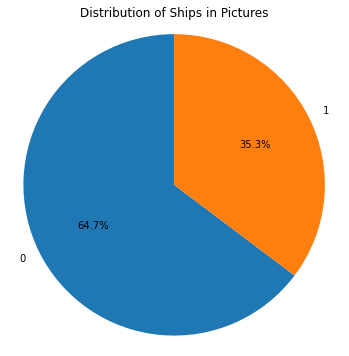

In [9]:
value_counts = df['Exist_ship'].value_counts()

# Create a pie chart
plt.figure(figsize=(6, 6))
plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=90)

plt.title('Distribution of Ships in Pictures')
plt.axis('equal')
plt.show()

## Disbalance classes with ship and no ship image (and pixels disbalance)!

In [10]:
# make copy, becouse I carry out manipulations with dataset
df2 = df.copy()
counts_df = df2.groupby(['ImageId']).agg({'Exist_ship': 'sum'}).reset_index()
counts_df.head()

,ImageId,Exist_ship
0,00003e153.jpg,0
1,0001124c7.jpg,0
2,000155de5.jpg,1
3,000194a2d.jpg,5
4,0001b1832.jpg,0


In [11]:
# how many ships on images
counts_df['Exist_ship'].value_counts()

0     150000
1      27104
2       7674
3       2954
4       1622
5        925
6        657
7        406
8        318
9        243
10       168
11       144
12       124
14        76
13        75
15        66
Name: Exist_ship, dtype: int64

In [12]:
# Statistics
counts_df['Exist_ship'].describe()

count    192556.000000
mean          0.424412
std           1.199094
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          15.000000
Name: Exist_ship, dtype: float64

In [13]:
print('Number of all ships:')
# sum of all images
counts_df['Exist_ship'].value_counts().sum()

Number of all ships:


192556

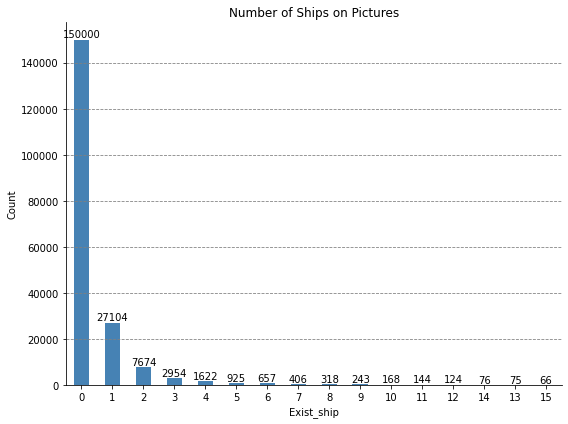

In [14]:
value_counts = counts_df['Exist_ship'].value_counts()

# Create a bar plot
plt.figure(figsize=(8, 6))
ax = value_counts.plot(kind='bar', color='steelblue')

# Set labels and title
plt.xlabel('Exist_ship')
plt.ylabel('Count')
plt.title('Number of Ships on Pictures')

# x-axis labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='center')

# Add data labels
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom')

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Show gridlines
ax.yaxis.grid(True, linestyle='--', color='gray')

# Adjust layout
plt.tight_layout()
plt.show()


In [15]:
# This function transforms EncodedPixels into a list of pixels
# Check our previous notebook for a detailed explanation:
# https://www.kaggle.com/julian3833/2-understanding-and-plotting-rle-bounding-boxes
def rle_to_pixels(rle_code):
    rle_code = [int(i) for i in rle_code.split()]
    pixels = [(pixel_position % 768, pixel_position // 768) 
                 for start, length in list(zip(rle_code[0:-1:2], rle_code[1:-2:2])) 
                 for pixel_position in range(start, start + length)]
    return pixels

def show_pixels_distribution(df):
    """
    Prints the amount of ship and no-ship pixels in the df
    """
    # Total images in the df
    n_images = df['ImageId'].nunique() 
    
    # Total pixels in the df
    total_pixels = n_images * 768 * 768 

    # Keep only rows with RLE boxes, transform them into list of pixels, sum the lengths of those lists
    ship_pixels = df['EncodedPixels'].dropna().apply(rle_to_pixels).str.len().sum() 

    ratio = ship_pixels / total_pixels
    print(f"Ship: {round(ratio, 3)} ({ship_pixels})")
    print(f"No ship: {round(1 - ratio, 3)} ({total_pixels - ship_pixels})")

### Only 1‰ of the pixels are ships, while 99.9% of the pixels are no-ships

In [16]:
show_pixels_distribution(df)

Ship: 0.001 (127777104)
No ship: 0.999 (113446373040)


### dropping all the images with no ships in them the class imbalance is reduced, but it's still very high: 5‰, this is, 0.5% of the pixels are ships while 99.5% are no-ship

In [17]:
show_pixels_distribution(df.dropna())

Ship: 0.005 (127777104)
No ship: 0.995 (24972773040)


# Viewing images

### Ships pictures

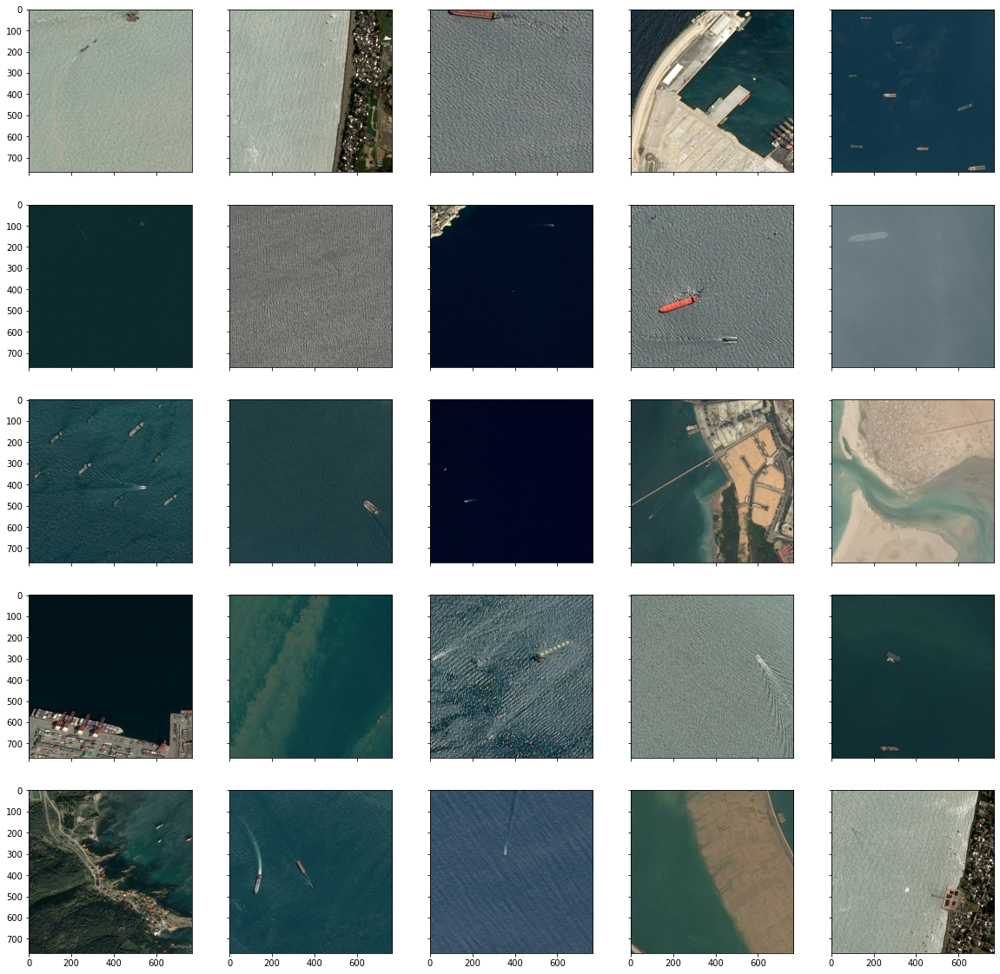

In [18]:
sample = df[~df.EncodedPixels.isna()].sample(25)

fig, ax = plt.subplots(5, 5, sharex='col', sharey='row')
fig.set_size_inches(20, 20)

for i, imgid in enumerate(sample.ImageId):
    col = i % 5
    row = i // 5
    
    path = Path('../input/airbus-ship-detection/train_v2') / '{}'.format(imgid)
    img = imread(path)
    
    ax[row, col].imshow(img)

### Pictures without ships

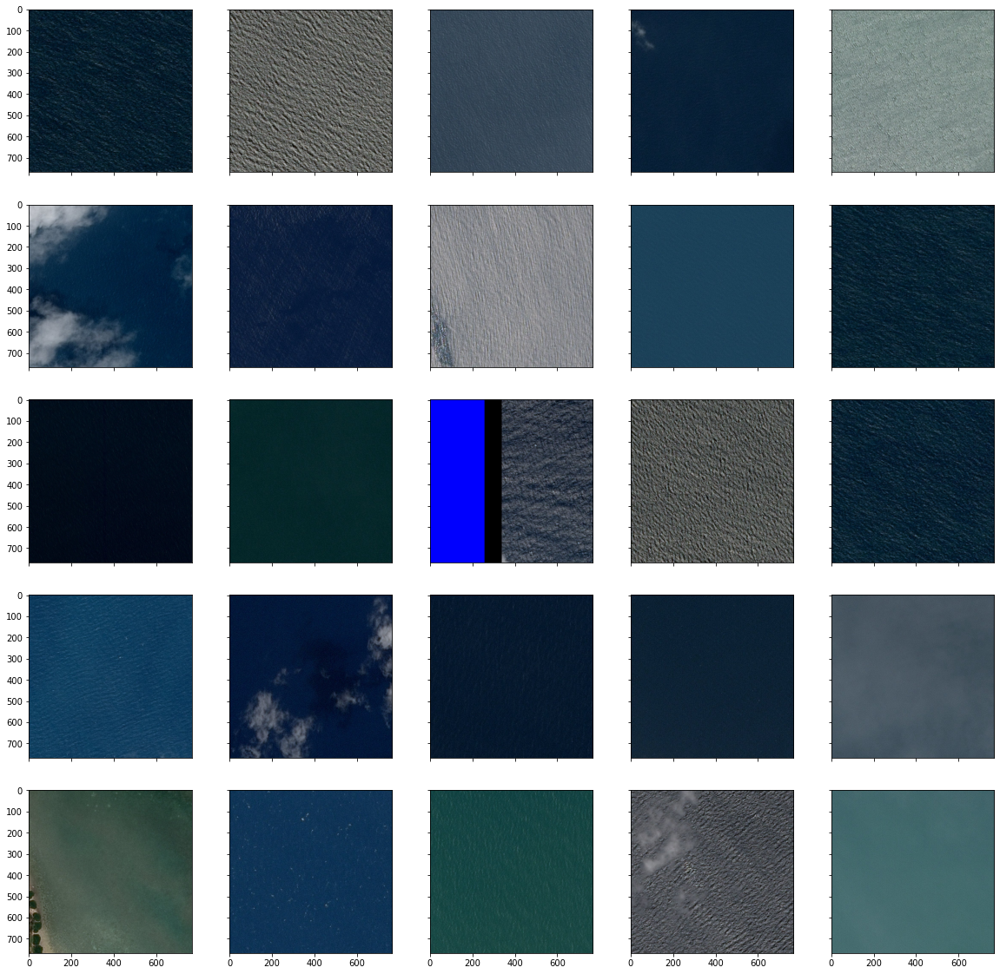

In [19]:
sample = df[df.EncodedPixels.isna()].sample(25)

fig, ax = plt.subplots(5, 5, sharex='col', sharey='row')
fig.set_size_inches(20, 20)

for i, imgid in enumerate(sample.ImageId):
    col = i % 5
    row = i // 5
    
    path = Path('../input/airbus-ship-detection/train_v2') / '{}'.format(imgid)
    img = imread(path)
    
    ax[row, col].imshow(img)

In [20]:
def get_filename(image_id, image_type):
    check_dir = False
    if "Train" == image_type:
        data_path = TRAIN_DIR
    elif "mask" in image_type:
        data_path = TRAIN_MASKS_DATA
    elif "Test" in image_type:
        data_path = TEST_DATA
    else:
        raise Exception("Image type '%s' is not recognized" % image_type)

    if check_dir and not os.path.exists(data_path):
        os.makedirs(data_path)

    return os.path.join(data_path, "{}".format(image_id))

def get_image_data(image_id, image_type, **kwargs):
    img = _get_image_data_opencv(image_id, image_type, **kwargs)
    img = img.astype('uint8')
    return img

def _get_image_data_opencv(image_id, image_type, **kwargs):
    fname = get_filename(image_id, image_type)
    img = cv2.imread(fname)
    assert img is not None, "Failed to read image : %s, %s" % (image_id, image_type)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
def rle_decode(mask_rle, shape=(768, 768)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T  # Needed to align to RLE direction

# https://github.com/ternaus/TernausNet/blob/master/Example.ipynb
def mask_overlay(image, mask):
    """
    Helper function to visualize mask
    """
    mask = mask.astype(np.uint8)
    weighted_sum = cv2.addWeighted(mask, 0.75, image, 0.5, 0.)
    img = image.copy()
    ind = mask[:, :, 1] > 0    
    img[ind] = weighted_sum[ind]    
    return img

In [21]:
train_ids = df.ImageId.values

### Some random images from training set

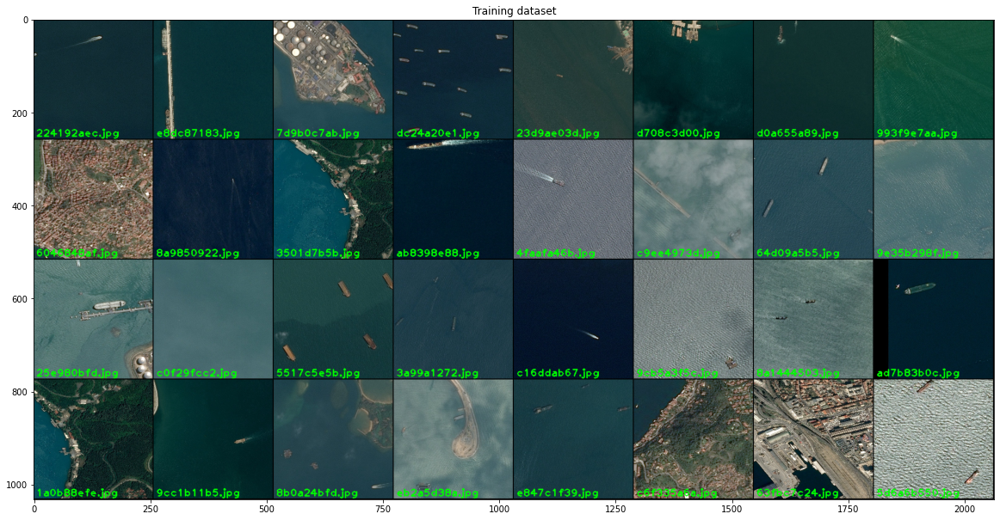

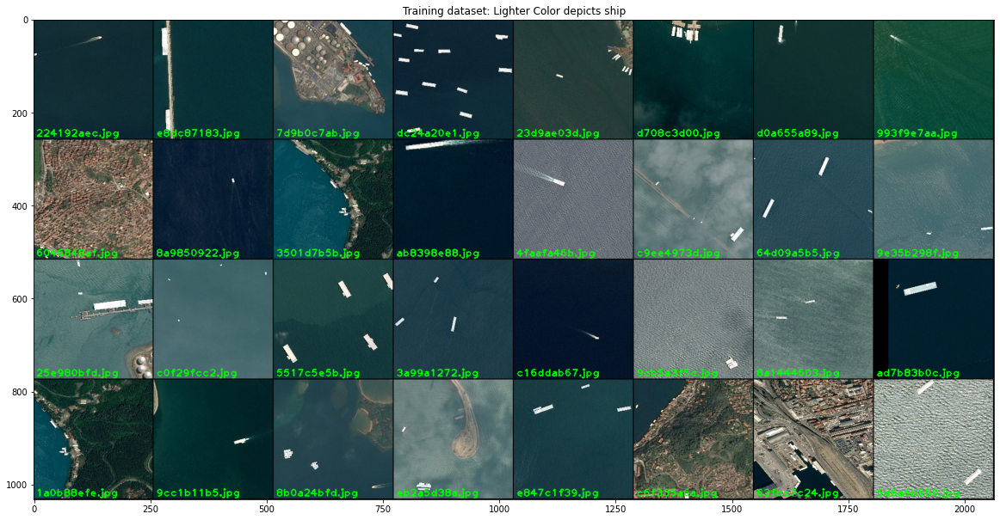

In [22]:
nImg = 32  #no. of images that you want to display
np.random.seed(42)
if df.index.name == 'ImageId':
    df = df.reset_index()
if df.index.name != 'ImageId':
    df = df.set_index('ImageId')
    
_train_ids = list(train_ids)
np.random.shuffle(_train_ids)
# _train_ids = _train_ids[:nImg]
tile_size = (256, 256)
n = 8
alpha = 0.3

# m = int(np.ceil(len(_train_ids) * 1.0 / n))
m = int(np.ceil(nImg * 1.0 / n))
complete_image = np.zeros((m*(tile_size[0]+2), n*(tile_size[1]+2), 3), dtype=np.uint8)
complete_image_masked = np.zeros((m*(tile_size[0]+2), n*(tile_size[1]+2), 3), dtype=np.uint8)

counter = 0
for i in range(m):
    ys = i*(tile_size[1] + 2)
    ye = ys + tile_size[1]
    j = 0
    while j < n:
        counter += 1
        all_masks = np.zeros((768, 768))
        xs = j*(tile_size[0] + 2)
        xe = xs + tile_size[0]
        image_id = _train_ids[counter]
        if str(df.loc[image_id,'EncodedPixels'])==str(np.nan):
            continue
        else:
            j += 1
        img = get_image_data(image_id, 'Train')
        
        try:
            img_masks = df.loc[image_id,'EncodedPixels'].tolist()
            for mask in img_masks:
                all_masks += rle_decode(mask)
            all_masks = np.expand_dims(all_masks,axis=2)
            all_masks = np.repeat(all_masks,3,axis=2).astype('uint8')*255
            
            img_masked = mask_overlay(img, all_masks)
            
#             img_masked =  cv2.addWeighted(img, alpha, all_masks, 1 - alpha,0)

            img = cv2.resize(img, dsize=tile_size)
            img_masked = cv2.resize(img_masked, dsize=tile_size)

            img = cv2.putText(img, image_id, (5,img.shape[0] - 5), cv2.FONT_HERSHEY_PLAIN, 1.5, (0, 255, 0), thickness=2)
            complete_image[ys:ye, xs:xe, :] = img[:,:,:]

            img_masked = cv2.putText(img_masked, image_id, (5,img.shape[0] - 5), cv2.FONT_HERSHEY_PLAIN, 1.5, (0, 255, 0), thickness=2)
            complete_image_masked[ys:ye, xs:xe, :] = img_masked[:,:,:]

        except Exception as e:
            all_masks = rle_decode(df.loc[image_id,'EncodedPixels'])
            all_masks = np.expand_dims(all_masks,axis=2)*255
            all_masks = np.repeat(all_masks,3,axis=2).astype('uint8')
            
            img_masked = mask_overlay(img, all_masks)        
#             img_masked =  cv2.addWeighted(img, alpha, all_masks, 1 - alpha,0)
    #         img_masked = cv2.bitwise_and(img, img, mask=all_masks)

            img = cv2.resize(img, dsize=tile_size)
            img_masked = cv2.resize(img_masked, dsize=tile_size)

            img = cv2.putText(img, image_id, (5,img.shape[0] - 5), cv2.FONT_HERSHEY_PLAIN, 1.5, (0, 255, 0), thickness=2)
            complete_image[ys:ye, xs:xe, :] = img[:,:,:]
#             pdb.set_trace()

            img_masked = cv2.putText(img_masked, image_id, (5,img.shape[0] - 5), cv2.FONT_HERSHEY_PLAIN, 1.5, (0, 255, 0), thickness=2)
            complete_image_masked[ys:ye, xs:xe, :] = img_masked[:,:,:]

        
m = complete_image.shape[0] / (tile_size[0] + 2)
k = 8
n = int(np.ceil(m / k))
for i in range(n):
    plt.figure(figsize=(20, 20))
    ys = i*(tile_size[0] + 2)*k
    ye = min((i+1)*(tile_size[0] + 2)*k, complete_image.shape[0])
    plt.imshow(complete_image[ys:ye,:,:],cmap='seismic')
    plt.title("Training dataset")
    
m = complete_image.shape[0] / (tile_size[0] + 2)
k = 8
n = int(np.ceil(m / k))
for i in range(n):
    plt.figure(figsize=(20, 20))
    ys = i*(tile_size[0] + 2)*k
    ye = min((i+1)*(tile_size[0] + 2)*k, complete_image.shape[0])
    plt.imshow(complete_image_masked[ys:ye,:,:])
    plt.title("Training dataset: Lighter Color depicts ship")

### Training Set Images with Ship Count 0 i.e. no ship

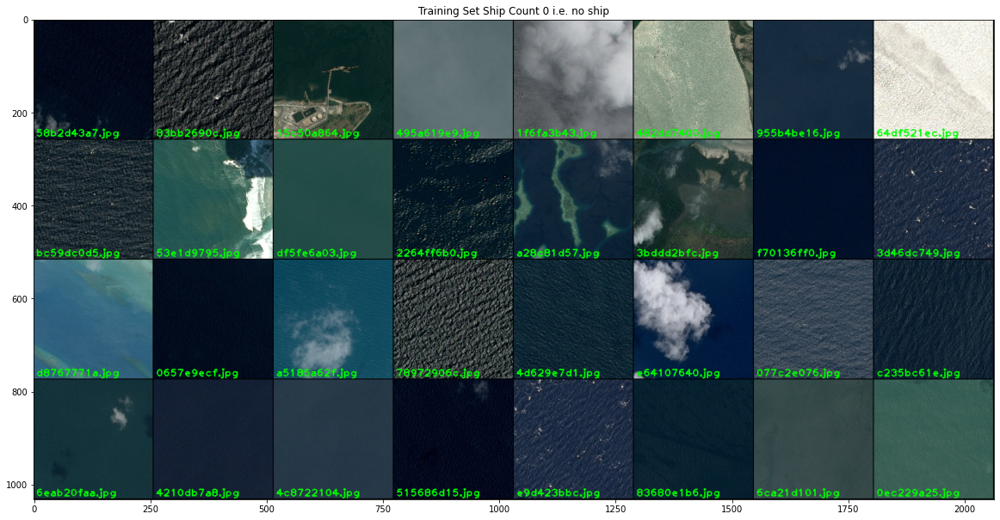

In [23]:
nImg = 32  #no. of images that you want to display
np.random.seed(42)
if df.index.name == 'ImageId':
    df = df.reset_index()
if df.index.name != 'ImageId':
    df = df.set_index('ImageId')
    
_train_ids = list(train_ids)
# _train_ids = list(train_ids[idx])
np.random.shuffle(_train_ids)
# _train_ids = _train_ids[:nImg]
tile_size = (256, 256)
n = 8
alpha = 0.4

# m = int(np.ceil(len(_train_ids) * 1.0 / n))
m = int(np.ceil(nImg * 1.0 / n))
complete_image = np.zeros((m*(tile_size[0]+2), n*(tile_size[1]+2), 3), dtype=np.uint8)
complete_image_masked = np.zeros((m*(tile_size[0]+2), n*(tile_size[1]+2), 3), dtype=np.uint8)

counter = 0
for i in range(m):
    ys = i*(tile_size[1] + 2)
    ye = ys + tile_size[1]
    j = 0
    while j < n:
        counter += 1

        all_masks = np.zeros((768, 768))
        xs = j*(tile_size[0] + 2)
        xe = xs + tile_size[0]
        image_id = _train_ids[counter]
        if str(df.loc[image_id,'EncodedPixels'])==str(np.nan):
            j += 1            
        else:
            continue
        img = get_image_data(image_id, 'Train')
        img = cv2.resize(img, dsize=tile_size)
        img = cv2.putText(img, image_id, (5,img.shape[0] - 5), cv2.FONT_HERSHEY_PLAIN, 1.5, (0, 255, 0), thickness=2)
        complete_image[ys:ye, xs:xe, :] = img[:,:,:]


m = complete_image.shape[0] / (tile_size[0] + 2)
k = 8
n = int(np.ceil(m / k))
for i in range(n):
    plt.figure(figsize=(20, 20))
    ys = i*(tile_size[0] + 2)*k
    ye = min((i+1)*(tile_size[0] + 2)*k, complete_image.shape[0])
    plt.imshow(complete_image[ys:ye,:,:])
    plt.title("Training Set Ship Count 0 i.e. no ship")

### Training Set Images with Ship Count greater than 10

In [24]:
df = df.reset_index()
df['ship_count'] = df.groupby('ImageId')['ImageId'].transform('count')
df.loc[df['EncodedPixels'].isnull().values,'ship_count'] = 0  #see infocusp's comment

#### For example, 975 ships in all pictures where are 13 ships (13*75=975):

In [25]:
df['ship_count'].value_counts()

0     150000
1      27104
2      15348
3       8862
4       6488
5       4625
6       3942
7       2842
8       2544
9       2187
10      1680
11      1584
12      1488
14      1064
15       990
13       975
Name: ship_count, dtype: int64

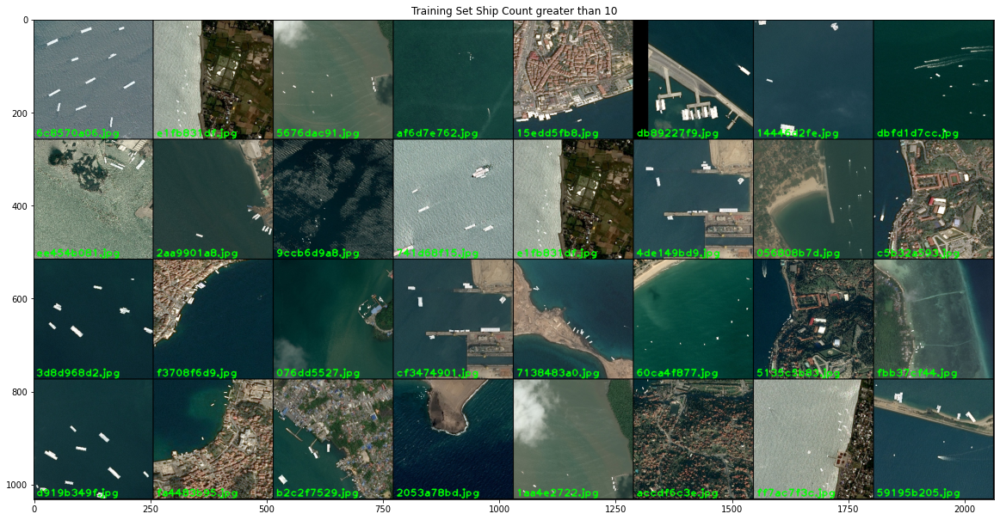

In [26]:
nImg = 32  #no. of images that you want to display
np.random.seed(42)
idx = np.ravel(np.where((df['ship_count']>10) ) )
if df.index.name == 'ImageId':
    df = df.reset_index()
_train_ids = list(df.loc[idx,'ImageId'])
if df.index.name != 'ImageId':
    df = df.set_index('ImageId')
# _train_ids = list(train_ids[idx])
np.random.shuffle(_train_ids)
# _train_ids = _train_ids[:nImg]
tile_size = (256, 256)
n = 8
alpha = 0.4

m = int(np.ceil(nImg * 1.0 / n))
complete_image = np.zeros((m*(tile_size[0]+2), n*(tile_size[1]+2), 3), dtype=np.uint8)
complete_image_masked = np.zeros((m*(tile_size[0]+2), n*(tile_size[1]+2), 3), dtype=np.uint8)

counter = 0
for i in range(m):
    ys = i*(tile_size[1] + 2)
    ye = ys + tile_size[1]
    j = 0
    while j < n:
        counter += 1
        all_masks = np.zeros((768, 768))
        xs = j*(tile_size[0] + 2)
        xe = xs + tile_size[0]
        image_id = _train_ids[counter]
        if str(df.loc[image_id,'EncodedPixels'])==str(np.nan):
            continue
        else:
            j += 1
        img = get_image_data(image_id, 'Train')
        
        try:
            img_masks = df.loc[image_id,'EncodedPixels'].tolist()
            for mask in img_masks:
                all_masks += rle_decode(mask)
            all_masks = np.expand_dims(all_masks,axis=2)
            all_masks = np.repeat(all_masks,3,axis=2).astype('uint8')*255
            
            img_masked = mask_overlay(img, all_masks)
#             img_masked =  cv2.addWeighted(img, alpha, all_masks, 1 - alpha,0)
            
            img = cv2.resize(img, dsize=tile_size)
            img_masked = cv2.resize(img_masked, dsize=tile_size)

            img = cv2.putText(img, image_id, (5,img.shape[0] - 5), cv2.FONT_HERSHEY_PLAIN, 1.5, (0, 255, 0), thickness=2)
            complete_image[ys:ye, xs:xe, :] = img[:,:,:]
#             pdb.set_trace()

            img_masked = cv2.putText(img_masked, image_id, (5,img.shape[0] - 5), cv2.FONT_HERSHEY_PLAIN, 1.5, (0, 255, 0), thickness=2)
            complete_image_masked[ys:ye, xs:xe, :] = img_masked[:,:,:]
            
#             pdb.set_trace()
        except Exception as e:
#             print(e,counter)
            all_masks = rle_decode(df.loc[image_id,'EncodedPixels'])
            all_masks = np.expand_dims(all_masks,axis=2)*255
            all_masks = np.repeat(all_masks,3,axis=2).astype('uint8')
        
            img_masked =  cv2.addWeighted(img, alpha, all_masks, 1 - alpha,0)
    #         img_masked = cv2.bitwise_and(img, img, mask=all_masks)

            img = cv2.resize(img, dsize=tile_size)
            img_masked = cv2.resize(img_masked, dsize=tile_size)

            img = cv2.putText(img, image_id, (5,img.shape[0] - 5), cv2.FONT_HERSHEY_PLAIN, 1.5, (0, 255, 0), thickness=2)
            complete_image[ys:ye, xs:xe, :] = img[:,:,:]
#             pdb.set_trace()

            img_masked = cv2.putText(img_masked, image_id, (5,img.shape[0] - 5), cv2.FONT_HERSHEY_PLAIN, 1.5, (0, 255, 0), thickness=2)
            complete_image_masked[ys:ye, xs:xe, :] = img_masked[:,:,:]
    
m = complete_image.shape[0] / (tile_size[0] + 2)
k = 8
n = int(np.ceil(m / k))
for i in range(n):
    plt.figure(figsize=(20, 20))
    ys = i*(tile_size[0] + 2)*k
    ye = min((i+1)*(tile_size[0] + 2)*k, complete_image.shape[0])
    plt.imshow(complete_image_masked[ys:ye,:,:])
    plt.title("Training Set Ship Count greater than 10")

### Wee can use some smoothing technique (like canny) to enhance the contrast between the ship and the background.

### RLE is a simple morse-like representation of shapes in 2d images. In this case, what's encoded are some rectangular shapes - the bounding boxes - where the ships are located in the respective images. RLE stored in column 'EncodedPixels' train_ship_segmentations_v2.csv

In [27]:
def masks_as_color(in_mask_list):
    '''
    drow in color different ships
    '''
    # Take the individual ship masks and create a color mask array for each ships
    all_masks = np.zeros((768, 768), dtype = np.float)
    scale = lambda x: (len(in_mask_list)+x+1) / (len(in_mask_list)*2) ## scale the heatmap image to shift 
    for i,mask in enumerate(in_mask_list):
        if isinstance(mask, str):
            all_masks[:,:] += scale(i) * rle_decode(mask)
    return all_masks

-
-
-
-
-
-
-
-
-
(768, 768)


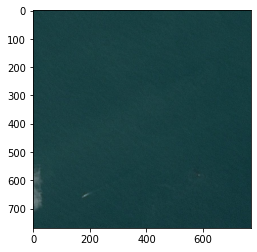

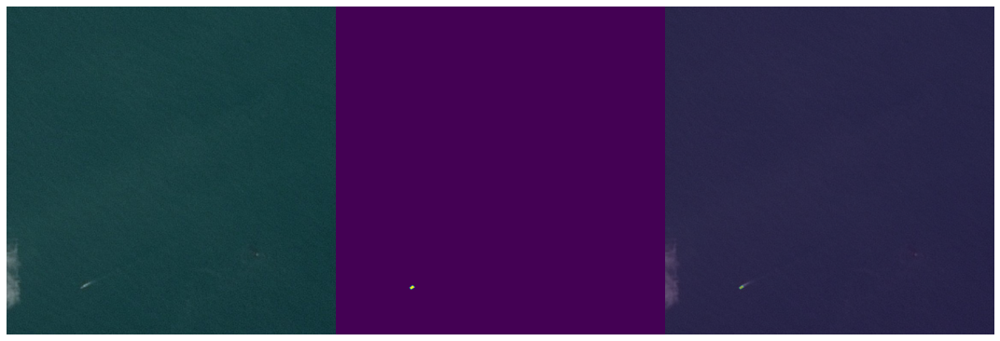

In [28]:
# try/except give for my code more optimization
# without this structure, plot showing only for image with ship
while True:
    try:
        IMG = TRAIN[np.random.randint(1000)]
        img = Image.open(TRAIN_DIR+"/"+IMG)

        plt.imshow(img)
        
        # img = imread(TRAIN+'/' + IMG)
        img_masks = df_show.loc[df_show['ImageId'] == IMG, 'EncodedPixels'].tolist()

        # Take the individual ship masks and create a single mask array for all ships
        all_masks = np.zeros((768, 768))
        for mask in img_masks:
            all_masks += rle_decode(mask)
            
        print(img.size)

        fig, axarr = plt.subplots(1, 3, figsize=(15, 40))
        axarr[0].axis('off')
        axarr[1].axis('off')
        axarr[2].axis('off')
        axarr[0].imshow(img)
        axarr[1].imshow(all_masks)
        axarr[2].imshow(img)
        axarr[2].imshow(all_masks, alpha=0.4)
        plt.tight_layout(h_pad=0.1, w_pad=0.1)
        plt.show()
        break
    except AttributeError as error:
        print('-')

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


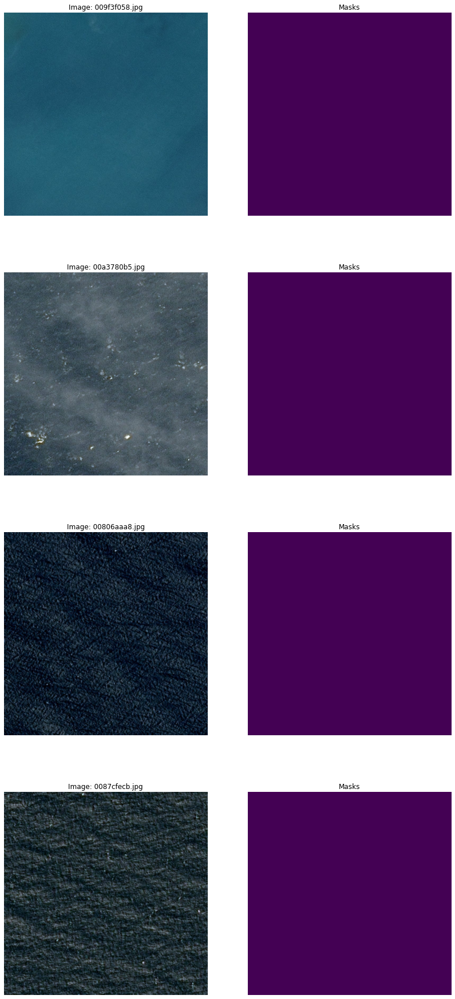

In [29]:
# compare pairs of images (original/mask) 
val = [np.random.randint(1000) for i in range(4)]

TOP_PREDICTIONS = 4
fig, m_axs = plt.subplots(TOP_PREDICTIONS, 2, figsize = (14, TOP_PREDICTIONS*8))
[c_ax.axis('off') for c_ax in m_axs.flatten()]

def raw_prediction(img, path=TRAIN_DIR):
    c_img = imread(os.path.join(path, c_img_name))
    c_img = np.expand_dims(c_img, 0)/255.0
    return c_img[0]

for (ax1, ax2), c_img_name in zip(m_axs, df_show.ImageId.loc[val]):
    c_img = raw_prediction(c_img_name)
    ax1.imshow(c_img)
    ax1.set_title('Image: ' + c_img_name)
    ax2.imshow(masks_as_color(df_show.query('ImageId==\"{}\"'.format(c_img_name))['EncodedPixels']))
    ax2.set_title('Masks')

### Colour distributions between images with ships and those without.

In [30]:
def get_img(imgid):
    '''Return image array, given ID.'''
    path = Path("../input/airbus-ship-detection/train_v2/") / '{}'.format(imgid)
    return imread(path)

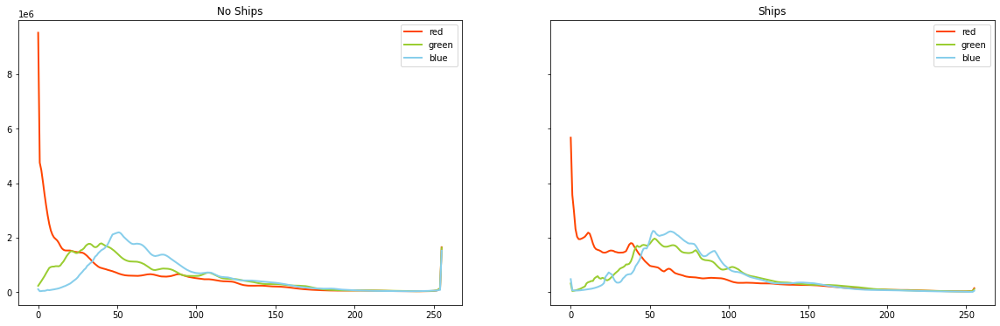

In [31]:
fig, ax = plt.subplots(1, 2, sharex='col', sharey='row')
fig.set_size_inches(20, 6)

mask = df_show.EncodedPixels.isna()
for i, (msk, label) in enumerate(zip([mask, ~mask], ['No Ships', 'Ships'])):
    _ids = df_show[msk].ImageId.sample(250)
    imgs = np.array([get_img(_id) for _id in _ids])
    
    red = imgs[:, :, :, 0]
    green = imgs[:, :, :, 1]
    blue = imgs[:, :, :, 2]
    
    ax[i].plot(np.bincount(red.ravel()), color='orangered', label='red', lw=2)
    ax[i].plot(np.bincount(green.ravel()), color='yellowgreen', label='green', lw=2)
    ax[i].plot(np.bincount(blue.ravel()), color='skyblue', label='blue', lw=2)
    ax[i].legend()
    ax[i].title.set_text(label)

### Colour distributions of areas with no ships and ships themselves

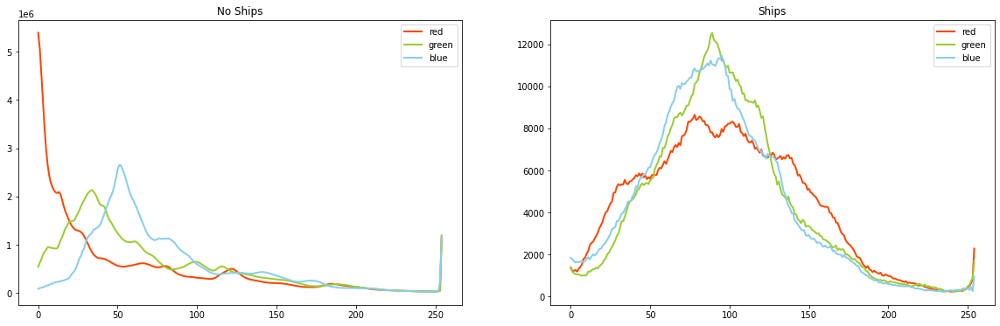

In [32]:
def apply_masks_to_img(img, _id, df):
    '''Apply masks to image given img, its id and the dataframe.'''
    masks = df[df.ImageId == _id].EncodedPixels.apply(lambda x: rle_decode(x)).tolist()
    masks = sum(masks)
    return img * masks.reshape(img.shape[0], img.shape[1], 1)


fig, ax = plt.subplots(1, 2, sharex='col')#, sharey='row')
fig.set_size_inches(20, 6)

mask = df_show.EncodedPixels.isna()
for i, (msk, label) in enumerate(zip([mask, ~mask], ['No Ships', 'Ships'])):
    _ids = df_show[msk].ImageId.sample(250)
    imgs = [get_img(_id) for _id in _ids]
    
    # if we have an encoding to decode
    if i == 1:
        imgs = [apply_masks_to_img(i, _id, df_show) for (i, _id) in zip(imgs, _ids)]

    imgs = np.array(imgs)
    red = imgs[:, :, :, 0]
    green = imgs[:, :, :, 1]
    blue = imgs[:, :, :, 2]
    
    # skip bincount index 0 to avoid the masked pixels to overpower the others.
    ax[i].plot(np.bincount(red.ravel())[1:], color='orangered', label='red', lw=2)
    ax[i].plot(np.bincount(green.ravel())[1:], color='yellowgreen', label='green', lw=2)
    ax[i].plot(np.bincount(blue.ravel())[1:], color='skyblue', label='blue', lw=2)
    ax[i].legend()
    ax[i].title.set_text(label)

### Spatial distribution

In [33]:
import numpy as np

def get_ship_coordinates(image_id):
    ship_rows = df_show[df_show['ImageId'] == image_id]
    ship_coordinates = []
    for encoded_pixels in ship_rows['EncodedPixels']:
        if isinstance(encoded_pixels, str):
            pixel_list = list(map(int, encoded_pixels.split()))
            for i in range(0, len(pixel_list), 2):
                x = pixel_list[i]
                length = pixel_list[i + 1]
                y_values = np.arange(x, x + length)
                ship_coordinates.extend([(x, y) for y in y_values])
    return np.array(ship_coordinates)


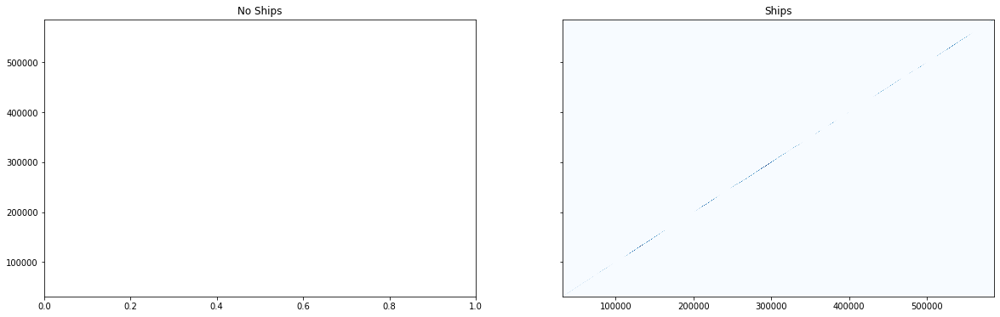

In [34]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, sharex='col', sharey='row')
fig.set_size_inches(20, 6)

mask = df_show.EncodedPixels.isna()
for i, (msk, label) in enumerate(zip([mask, ~mask], ['No Ships', 'Ships'])):
    _ids = df_show[msk].ImageId.sample(5)
    num_ships = [len(df_show[df_show.ImageId == _id]) for _id in _ids]
    ship_coordinates = [get_ship_coordinates(_id) for _id in _ids]

    # Calculate the number of ships based on the available information
    num_ships = [len(df_show[df_show.ImageId == _id]) for _id in _ids]

    # Calculate the x and y coordinates for each ship in the image
    ship_coordinates = [get_ship_coordinates(_id) for _id in _ids]

    # Combine all ship coordinates into a single array
    all_coordinates = [coord for coords in ship_coordinates for coord in coords]

    x_coordinates = [coord[0] for coord in all_coordinates]
    y_coordinates = [coord[1] for coord in all_coordinates]
    
    # Create histograms of ship coordinates
    ax[i].hist2d(x_coordinates, y_coordinates, bins=500, cmap='Blues')
    ax[i].title.set_text(label)

plt.show()
